# Import Modules

In [3]:
import importlib
import os
import sys

import joblib
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns
from sklearn.model_selection import train_test_split

In [4]:
os.chdir("../")
sys.path.insert(0, os.getcwd())

In [5]:
from morai.experience import charters
from morai.forecast import metrics, models, preprocessors
from morai.utils import custom_logger, helpers

In [6]:
logger = custom_logger.setup_logging(__name__)

In [7]:
# update log level if wanting more logging
custom_logger.set_log_level("INFO")

In [8]:
pd.options.display.float_format = "{:,.2f}".format

# Data

In [9]:
pl_parquet_path = r"files\dataset\mortality_grouped.parquet"

In [10]:
# reading in the dataset
# `enable_string_cache` helps with categorical type values
# casting columns to categorical (shouldn't need to do this, but it was changed in aggregation)
pl.enable_string_cache()
lzdf = pl.scan_parquet(
    pl_parquet_path,
).cast(
    {
        "sex": pl.Categorical,
        "smoker_status": pl.Categorical,
    }
)

In [11]:
initial_row_count = lzdf.select(pl.len()).collect().item()
print(
    f"row count: {initial_row_count} \n"
    f"exposures: {lzdf.select([pl.col('amount_exposed').sum()]).collect()[0,0]}"
)

row count: 1793414 
exposures: 9882883284164.027


In [12]:
grouped_df = lzdf.collect()

In [13]:
grouped_df = grouped_df.to_pandas()

# Functions

In [14]:
def add_qx_exp_ae(model_data, predictions, model_name):
    model_data[f"qx_{model_name}"] = predictions
    model_data[f"exp_amt_{model_name}"] = (
        model_data[f"qx_{model_name}"] * model_data["amount_exposed"]
    )
    model_data[f"ae_{model_name}"] = np.where(
        model_data["amount_exposed"] == 0,
        0,
        np.where(
            model_data[f"exp_amt_{model_name}"] == 0,
            1,
            model_data["death_claim_amount"] / model_data[f"exp_amt_{model_name}"],
        ),
    )
    return model_data

In [15]:
def get_importance(features, values):
    importance = pd.DataFrame({"feature": features, "importance": values})
    importance = importance.sort_values(by="importance", ascending=False)
    return importance

# Preparing Data

## Filter

In [16]:
model_data = grouped_df[
    (grouped_df["attained_age"] >= 50)
    & (grouped_df["attained_age"] <= 95)
    & (grouped_df["issue_age"] >= 30)
    & (grouped_df["issue_age"] <= 80)
].copy()
model_data = model_data.reset_index(drop=True)

In [17]:
del grouped_df

## Calculated Fields

In [18]:
model_data["capped_duration"] = model_data["duration"].clip(upper=26)
model_data["qx_log_raw"] = np.log(model_data["qx_raw"] + 1)

## Feature Dictionary

In [19]:
feature_dict = {
    "target": ["qx_raw"],
    "weight": ["amount_exposed"],
    "passthrough": ["attained_age", "duration", "observation_year"],
    "ordinal": [
        "sex",
        "slct_ult_ind",
        "smoker_status",
    ],
    "ohe": [
        "face_amount_band",
        "insurance_plan",
        "number_of_pfd_classes",
        "preferred_class",
    ],
    "nominal": [],
}

feature_dict_vbt = {
    "target": ["qx_raw"],
    "weight": ["amount_exposed"],
    "passthrough": ["attained_age", "capped_duration"],
    "ordinal": [
        "sex",
        "smoker_status",
    ],
    "ohe": [],
    "nominal": [],
}

## Model Results Dictionary

In [20]:
metric_cols = ["ae", "smape", "r2_score", "root_mean_squared_error", "aic", "shape"]
model_results = metrics.ModelResults(metrics=metric_cols)

### VBT15

In [21]:
model_name = "vbt15"

In [22]:
scorecard = model_results.get_scorecard(
    y_true_train=model_data["death_claim_amount"],
    y_pred_train=model_data[f"exp_amt_{model_name}"],
    weights_train=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=None,
    model_params=None,
    scorecard=scorecard,
    importance=None,
)

 2024-06-18 12:10:37 | morai.forecast.metrics | INFO     | Adding model 'vbt15' 


# Forecasting Models

In [23]:
model_build = True
model_load = False
model_save = False

## GLM

**Feature Preprocessing:**
  - GLM - using one-hot enconding (ohe) as the model needs the categories to be diferentiated and not ordinal or nominal. This only applies to non-binary features.
  - Scaling should be considered to ensure the features aren't overly weighted by larger values.

**Model Characteristics**
  - GLM is a simpler type of model and is easily understandable

In [27]:
model_name = "glm"

In [28]:
preprocess_dict = preprocessors.preprocess_data(
    model_data,
    feature_dict=feature_dict_vbt,
    standardize=False,
    add_constant=True,
)

 2024-04-28 15:31:56 | morai.forecast.preprocessors | INFO     | model target: ['qx_raw'] 
 2024-04-28 15:31:56 | morai.forecast.preprocessors | INFO     | model weights: ['amount_exposed'] 
 2024-04-28 15:31:56 | morai.forecast.preprocessors | INFO     | adding a constant column to the data 
 2024-04-28 15:31:56 | morai.forecast.preprocessors | INFO     | passthrough - (generally numeric): ['attained_age', 'capped_duration', 'constant'] 
 2024-04-28 15:31:57 | morai.forecast.preprocessors | INFO     | ordinal - ordinal encoded: ['smoker_status', 'sex'] 


In [29]:
X = preprocess_dict["X"]
y = preprocess_dict["y"]
weights = preprocess_dict["weights"]
mapping = preprocess_dict["mapping"]
md_encoded = preprocess_dict["md_encoded"]
model_features = preprocess_dict["model_features"]

X_train, X_test, y_train, y_test, weights_train, weights_test = train_test_split(
    X, y, weights, random_state=0, test_size=0.2
)

In [361]:
GLM = models.GLM()
if model_build:
    GLM.fit(X=X_train, y=y_train, weights=weights_train, r_style=False)
if model_load:
    GLM.model = joblib.load(f"files/models/{model_name}.joblib")
    logger.info(f"loaded model '{model_name}'")
if model_save:
    joblib.dump(GLM.model, f"files/models/{model_name}.joblib")
    logger.info(f"saved model '{model_name}'")

model_params = {"weights": True, "r_style": False}
model_params.update({"family": GLM.model.family})

 2024-04-28 13:48:10 | __main__ | INFO     | loaded model 'glm' 


In [362]:
print(GLM.model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                 qx_raw   No. Observations:               874836
Model:                            GLM   Df Residuals:         3479386432503.58
Model Family:                Binomial   Df Model:                            4
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -7.5255e+10
Date:                Sun, 28 Apr 2024   Deviance:                   7.3424e+10
Time:                        13:48:11   Pearson chi2:                 4.36e+11
No. Iterations:                    15   Pseudo R-squ. (CS):              1.000
Covariance Type:            nonrobust                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
attained_age        0.1166   7.27e-07    1

In [189]:
predictions = GLM.model.predict(X)
print(f"NA values: {predictions.isna().sum()}")

NA values: 0


In [28]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [29]:
odds = GLM.get_odds(display=False)
importance = get_importance(features=odds.index.tolist(), values=odds.values.tolist())

 2024-04-25 00:55:56 | morai.forecast.models | INFO     | generating odds ratio from model 


In [30]:
scorecard = model_results.get_scorecard(
    y_true_train=y_train,
    y_pred_train=GLM.model.predict(X_train),
    weights_train=weights_train,
    y_true_test=y_test,
    y_pred_test=GLM.model.predict(X_test),
    weights_test=weights_test,
    model=GLM.model,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=preprocess_dict,
    model_params=model_params,
    scorecard=scorecard,
    importance=importance,
)

 2024-04-25 00:55:56 | morai.forecast.metrics | INFO     | Adding model 'glm' 


 2024-04-25 00:55:56 | morai.experience.charters | INFO     | Binning feature: [duration] with 6 bins 


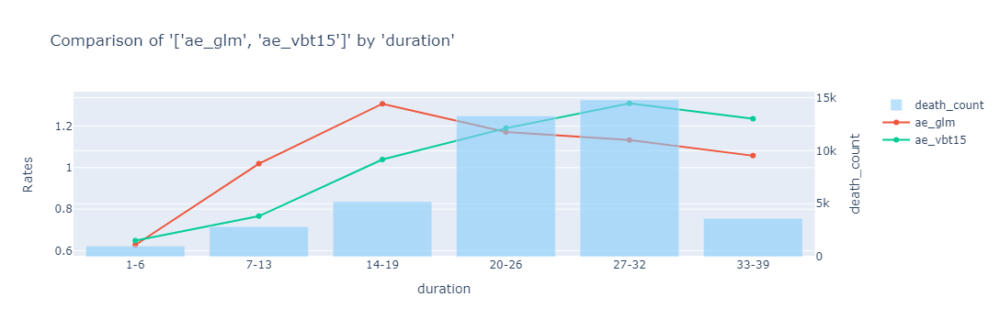

In [31]:
charters.compare_rates(
    df=model_data[model_data["insurance_plan"].isin(["UL"])],
    x_axis="duration",
    rates=["ae_glm", "ae_vbt15"],
    weights=["exp_amt_glm", "exp_amt_vbt15"],
    secondary="death_count",
    x_bins=6,
    display=True,
)

 2024-04-25 00:55:57 | morai.experience.charters | INFO     | The weights list is 1 long and should be 3 long. Using the first weight for all weights. 


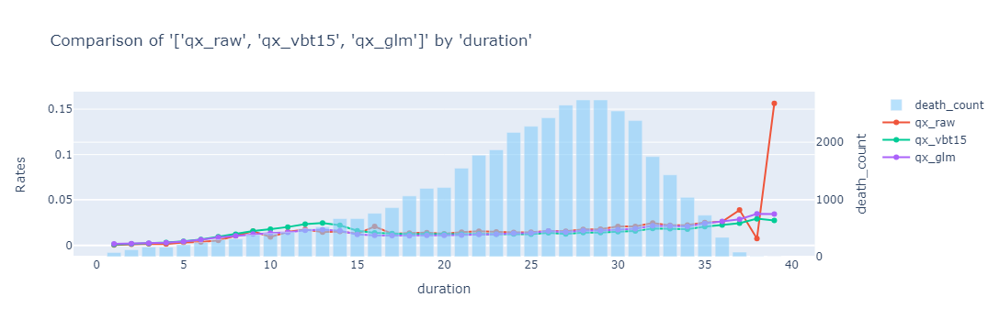

In [32]:
charters.compare_rates(
    model_data[model_data["insurance_plan"].isin(["UL"])],
    x_axis="duration",
    rates=["qx_raw", "qx_vbt15", "qx_glm"],
    weights=["amount_exposed"],
    secondary="death_count",
    y_log=False,
)

 2024-04-27 00:46:18 | morai.experience.charters | INFO     | Model: [GLMResultsWrapper] for partial dependence plot. 
 2024-04-27 00:46:18 | morai.experience.charters | INFO     | Weights: [amount_exposed] 
 2024-04-27 00:46:18 | morai.experience.charters | INFO     | x_axis: [capped_duration] type: [passthrough] 
 2024-04-27 00:46:18 | morai.experience.charters | WARNING  | Using a quick method for pdp. Results may not be as accurate. 


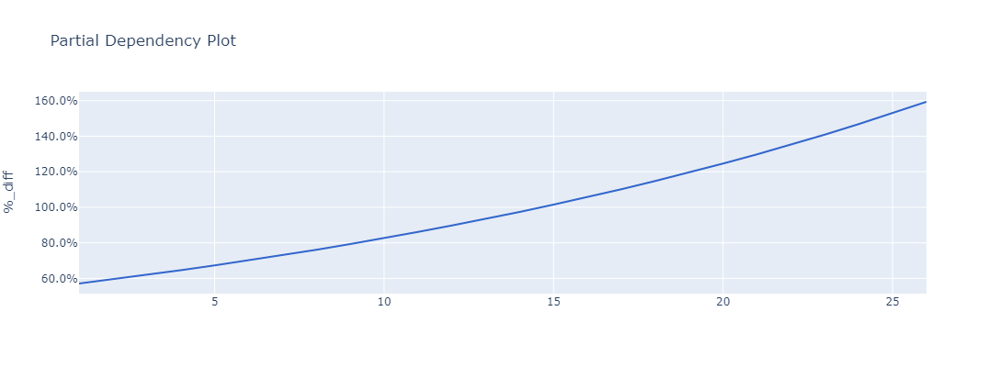

In [191]:
charters.pdp(
    model=GLM.model,
    df=md_encoded,
    x_axis="capped_duration",
    mapping=mapping,
    weight="amount_exposed",
)

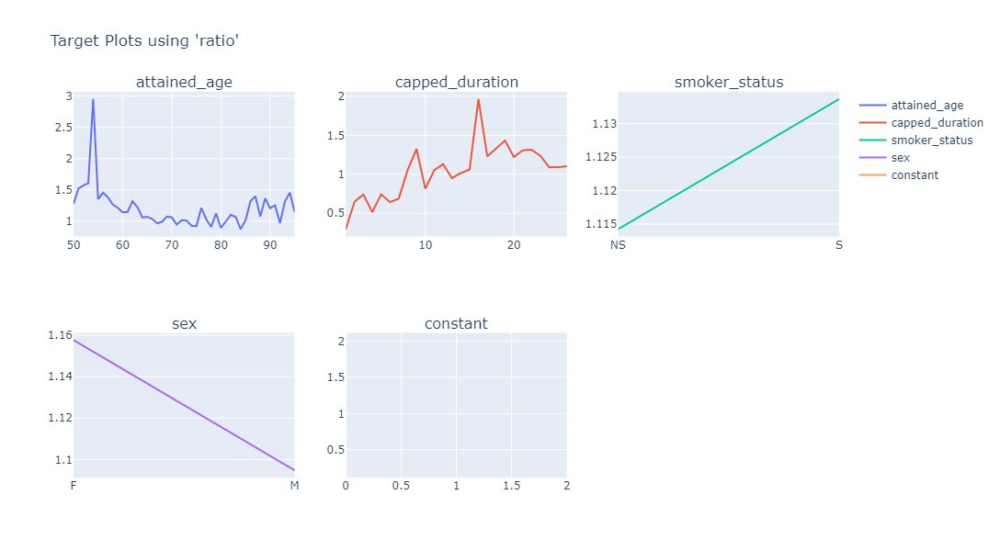

In [34]:
charters.target(
    df=model_data[model_data["insurance_plan"].isin(["UL"])],
    target="ratio",
    cols=3,
    features=model_features,
    numerator="death_claim_amount",
    denominator="exp_amt_glm",
).show()

## Linear Regression

**Feature Preprocessing:**
- Linear regression needs all features to be numeric.

In [35]:
model_name = "lr"

In [36]:
preprocess_dict = preprocessors.preprocess_data(
    model_data,
    feature_dict=feature_dict,
    standardize=False,
)

 2024-04-25 00:56:00 | morai.forecast.preprocessors | WARNING  | ['slct_ult_ind'] not in the model_data 
 2024-04-25 00:56:00 | morai.forecast.preprocessors | INFO     | model target: ['qx_raw'] 
 2024-04-25 00:56:00 | morai.forecast.preprocessors | INFO     | model weights: ['amount_exposed'] 
 2024-04-25 00:56:00 | morai.forecast.preprocessors | INFO     | passthrough - (generally numeric): ['attained_age', 'duration', 'observation_year'] 
 2024-04-25 00:56:00 | morai.forecast.preprocessors | INFO     | ordinal - ordinal encoded: ['smoker_status', 'sex'] 
 2024-04-25 00:56:01 | morai.forecast.preprocessors | INFO     | nominal - one hot encoded: ['face_amount_band', 'insurance_plan', 'preferred_class', 'number_of_pfd_classes'] 


In [37]:
X = preprocess_dict["X"]
y = preprocess_dict["y"]
weights = preprocess_dict["weights"]
mapping = preprocess_dict["mapping"]
md_encoded = preprocess_dict["md_encoded"]
model_features = preprocess_dict["model_features"]

X_train, X_test, y_train, y_test, weights_train, weights_test = train_test_split(
    X, y, weights, random_state=0, test_size=0.2
)

In [38]:
from sklearn import linear_model

if model_build:
    model = linear_model.LinearRegression()
    model.fit(X_train, y_train, sample_weight=weights_train)
if model_load:
    model = joblib.load(f"files/models/{model_name}.joblib")
    logger.info(f"loaded model '{model_name}'")
if model_save:
    joblib.dump(model, f"files/models/{model_name}.joblib")
    logger.info(f"saved model '{model_name}'")

model_params = {"weights": True}
model_params.update(model.get_params())

 2024-04-25 00:56:03 | __main__ | INFO     | saved model 'lr' 


In [39]:
predictions = model.predict(X)

In [40]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [41]:
importance = get_importance(features=X.columns, values=model.coef_)

In [42]:
scorecard = model_results.get_scorecard(
    y_true_train=y_train,
    y_pred_train=model.predict(X_train),
    weights_train=weights_train,
    y_true_test=y_test,
    y_pred_test=model.predict(X_test),
    weights_test=weights_test,
    model=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=preprocess_dict,
    model_params=model_params,
    scorecard=scorecard,
    importance=importance,
)

 2024-04-25 00:56:04 | morai.forecast.metrics | INFO     | Adding model 'lr' 


 2024-04-25 00:56:04 | morai.experience.charters | INFO     | The weights list is 1 long and should be 3 long. Using the first weight for all weights. 


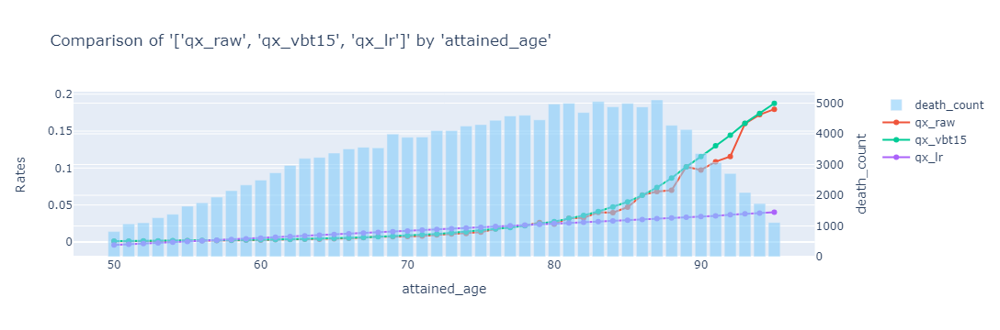

In [43]:
charters.compare_rates(
    model_data,
    x_axis="attained_age",
    rates=["qx_raw", "qx_vbt15", "qx_lr"],
    weights=["amount_exposed"],
    secondary="death_count",
)

 2024-04-25 00:56:05 | morai.experience.charters | INFO     | Model: [LinearRegression] for partial dependence plot. 
 2024-04-25 00:56:05 | morai.experience.charters | INFO     | Weights: [amount_exposed] 
 2024-04-25 00:56:05 | morai.experience.charters | INFO     | x_axis: [insurance_plan] type: [passthrough] 


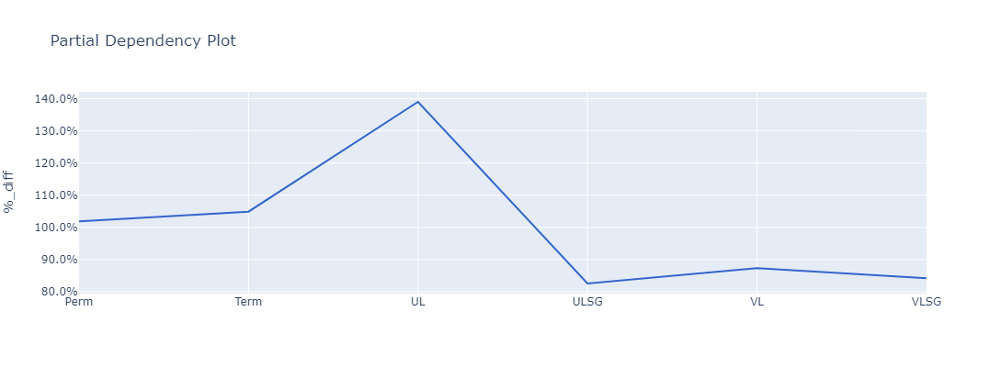

In [44]:
charters.pdp(
    model=model,
    df=md_encoded,
    x_axis="insurance_plan",
    mapping=mapping,
    weight="amount_exposed",
)

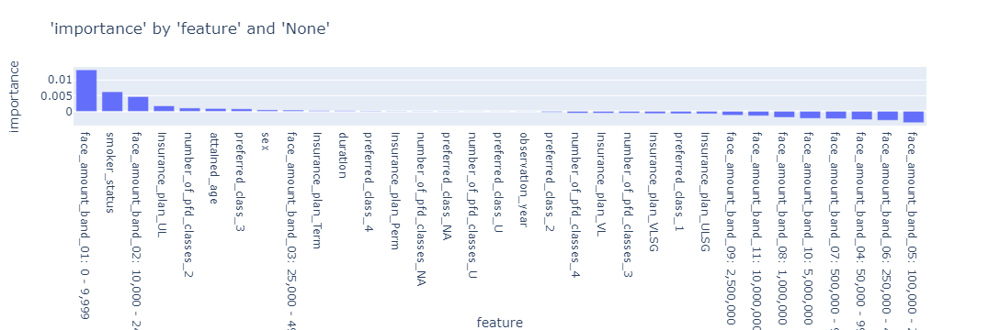

In [45]:
charters.chart(
    df=importance, x_axis="feature", y_axis="importance", type="bar", y_sort=True
)

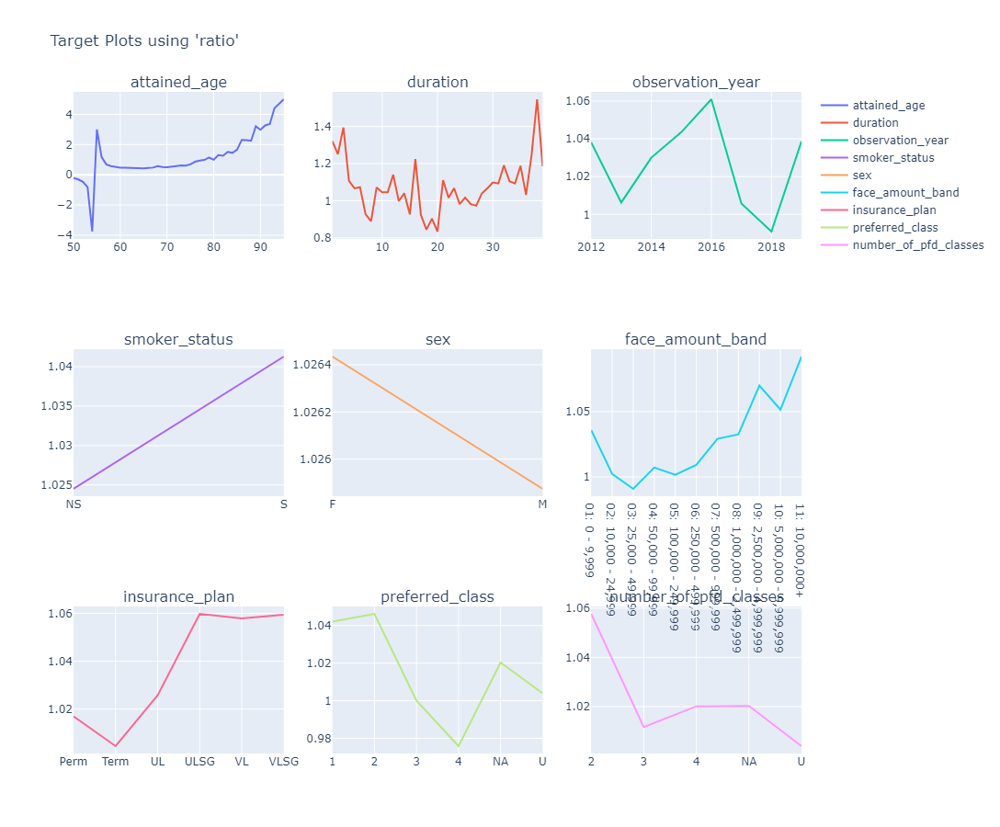

In [46]:
charters.target(
    df=model_data,
    target="ratio",
    cols=3,
    features=model_features,
    numerator="death_claim_amount",
    denominator="exp_amt_lr",
)

## Decision Tree

**Feature Preprocessing:**
  - Tree is using ordinal as there is no categorical for this implementation of decision tree
  - Scaling is not necessary in decision trees as the splits are done at certain points and not scaled

In [24]:
model_name = "tree"

In [25]:
preprocess_dict = preprocessors.preprocess_data(
    model_data,
    feature_dict=feature_dict,
    standardize=False,
    preset="tree",
)

 2024-06-18 12:10:43 | morai.forecast.preprocessors | WARNING  | ['slct_ult_ind'] not in the model_data 
 2024-06-18 12:10:43 | morai.forecast.preprocessors | INFO     | using 'tree' preset which doesn't need to use 'nominal' or 'ohe' and instead uses 'ordinal' 
 2024-06-18 12:10:43 | morai.forecast.preprocessors | INFO     | model target: ['qx_raw'] 
 2024-06-18 12:10:43 | morai.forecast.preprocessors | INFO     | model weights: ['amount_exposed'] 
 2024-06-18 12:10:43 | morai.forecast.preprocessors | INFO     | passthrough - (generally numeric): ['attained_age', 'duration', 'observation_year'] 
 2024-06-18 12:10:43 | morai.forecast.preprocessors | INFO     | ordinal - ordinal encoded: ['sex', 'smoker_status', 'number_of_pfd_classes', 'preferred_class', 'insurance_plan', 'face_amount_band'] 


In [26]:
X = preprocess_dict["X"]
y = preprocess_dict["y"]
weights = preprocess_dict["weights"]
mapping = preprocess_dict["mapping"]
md_encoded = preprocess_dict["md_encoded"]
model_features = preprocess_dict["model_features"]

X_train, X_test, y_train, y_test, weights_train, weights_test = train_test_split(
    X, y, weights, random_state=0, test_size=0.2
)

In [27]:
from sklearn.tree import DecisionTreeRegressor

if model_build:
    model = DecisionTreeRegressor(max_depth=6)

    model.fit(X_train, y_train, sample_weight=weights_train)
if model_load:
    model = joblib.load(f"files/models/{model_name}.joblib")
    logger.info(f"loaded model '{model_name}'")
if model_save:
    joblib.dump(model, f"files/models/{model_name}.joblib")
    logger.info(f"saved model '{model_name}'")
model_params = {"weights": True}
model_params.update(model.get_params())

In [28]:
predictions = model.predict(X)

In [29]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [30]:
importance = get_importance(features=X.columns, values=model.feature_importances_)

In [54]:
scorecard = model_results.get_scorecard(
    y_true_train=y_train,
    y_pred_train=model.predict(X_train),
    weights_train=weights_train,
    y_true_test=y_test,
    y_pred_test=model.predict(X_test),
    weights_test=weights_test,
    model=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=preprocess_dict,
    model_params=model_params,
    scorecard=scorecard,
    importance=importance,
)

 2024-04-25 00:56:15 | morai.forecast.metrics | INFO     | Adding model 'tree' 


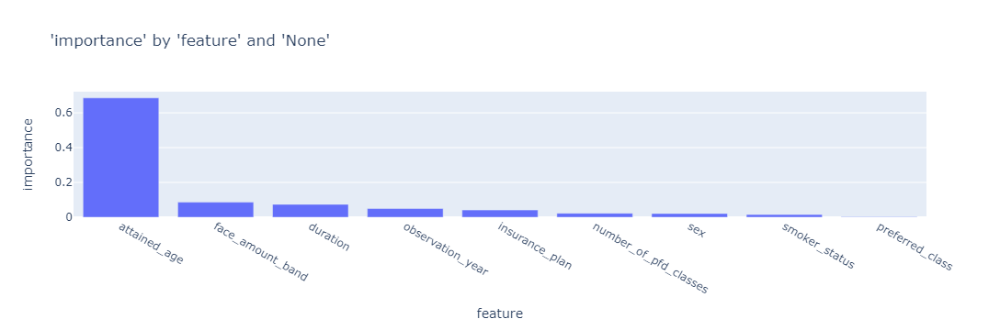

In [31]:
charters.chart(
    df=importance, x_axis="feature", y_axis="importance", type="bar", y_sort=True
)

 2024-04-25 00:56:15 | morai.experience.charters | INFO     | The weights list is 1 long and should be 3 long. Using the first weight for all weights. 


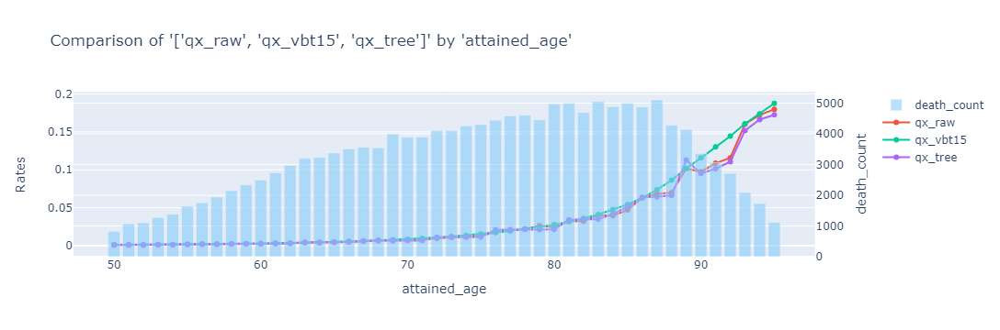

In [56]:
charters.compare_rates(
    model_data,
    x_axis="attained_age",
    rates=["qx_raw", "qx_vbt15", "qx_tree"],
    weights=["amount_exposed"],
    secondary="death_count",
)

 2024-06-18 12:12:06 | morai.experience.charters | INFO     | Model: [DecisionTreeRegressor] for partial dependence plot. 
 2024-06-18 12:12:06 | morai.experience.charters | INFO     | Weights: [amount_exposed] 
 2024-06-18 12:12:06 | morai.experience.charters | INFO     | x_axis: [observation_year] type: [passthrough] 
 2024-06-18 12:12:06 | morai.experience.charters | INFO     | Line feature: [sex] type: [ordinal] 
 2024-06-18 12:12:06 | morai.experience.charters | INFO     | Creating 16 predictions. 


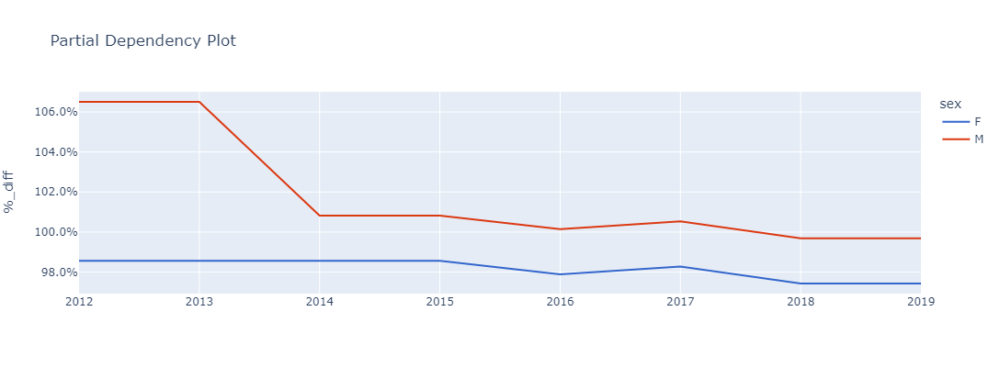

In [35]:
charters.pdp(
    model=model,
    df=md_encoded,
    x_axis="observation_year",
    line_color="sex",
    mapping=mapping,
    weight="amount_exposed",
)

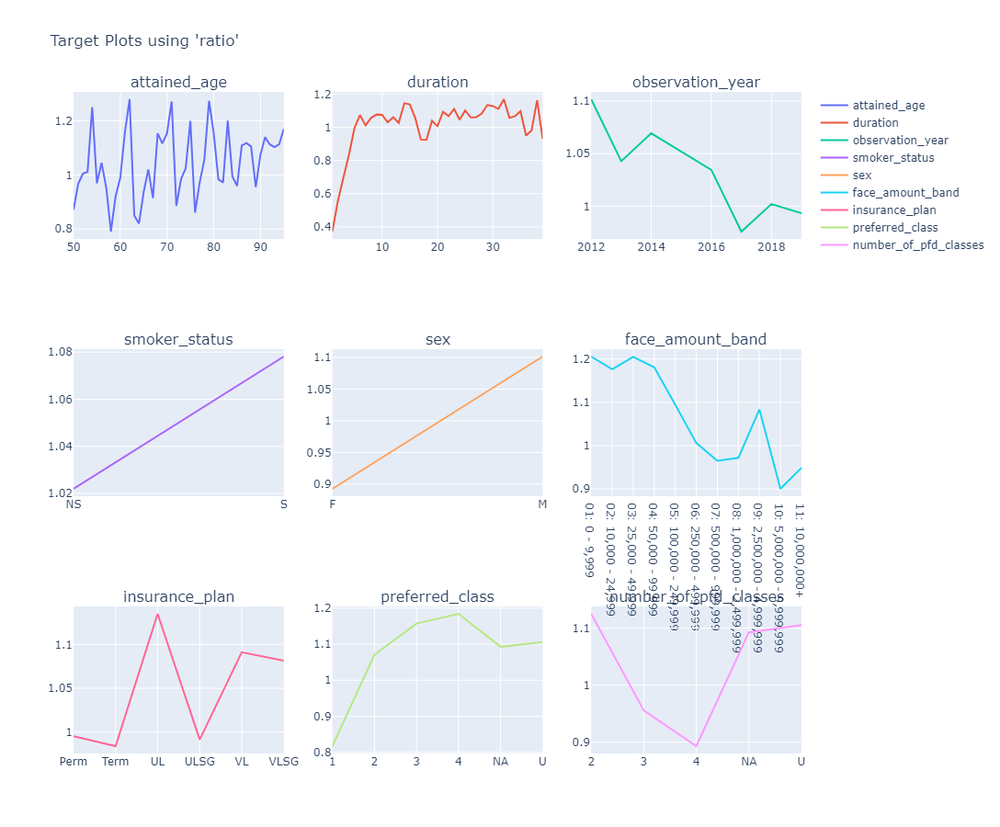

In [58]:
charters.target(
    df=model_data,
    target="ratio",
    cols=3,
    features=model_features,
    numerator="death_claim_amount",
    denominator="exp_amt_tree",
).show()

## Random Forest

**Feature Preprocessing:**
  - Tree is using ordinal as there is no categorical for this implementation of decision tree
  - Scaling is not necessary in decision trees as the splits are done at certain points and not scaled

**Model Characteristics**
  - Random Forest is good at finding non-linear relationships and is a `bagging` type model which limits overfitting.

In [22]:
model_name = "rf"

In [23]:
preprocess_dict = preprocessors.preprocess_data(
    model_data,
    feature_dict=feature_dict,
    standardize=False,
    preset="tree",
)

 2024-04-28 15:28:57 | morai.forecast.preprocessors | WARNING  | ['slct_ult_ind'] not in the model_data 
 2024-04-28 15:28:57 | morai.forecast.preprocessors | INFO     | using 'tree' preset which doesn't need to use 'nominal' or 'ohe' and instead uses 'ordinal' 
 2024-04-28 15:28:57 | morai.forecast.preprocessors | INFO     | model target: ['qx_raw'] 
 2024-04-28 15:28:57 | morai.forecast.preprocessors | INFO     | model weights: ['amount_exposed'] 
 2024-04-28 15:28:57 | morai.forecast.preprocessors | INFO     | passthrough - (generally numeric): ['attained_age', 'duration', 'observation_year'] 
 2024-04-28 15:28:57 | morai.forecast.preprocessors | INFO     | ordinal - ordinal encoded: ['smoker_status', 'sex', 'number_of_pfd_classes', 'insurance_plan', 'preferred_class', 'face_amount_band'] 


In [24]:
X = preprocess_dict["X"]
y = preprocess_dict["y"]
weights = preprocess_dict["weights"]
mapping = preprocess_dict["mapping"]
md_encoded = preprocess_dict["md_encoded"]
model_features = preprocess_dict["model_features"]

X_train, X_test, y_train, y_test, weights_train, weights_test = train_test_split(
    X, y, weights, random_state=0, test_size=0.2
)

In [431]:
from sklearn.ensemble import RandomForestRegressor

if model_build:
    model = RandomForestRegressor(
        n_estimators=100,
        max_depth=15,
        min_samples_split=5,
        min_samples_leaf=5,
        oob_score=True,
        random_state=42,
    )

    model.fit(X_train, y_train, sample_weight=weights_train)
if model_load:
    model = joblib.load(f"files/models/{model_name}.joblib")
    logger.info(f"loaded model '{model_name}'")
if model_save:
    joblib.dump(model, f"files/models/{model_name}.joblib")
    logger.info(f"saved model '{model_name}'")

model_params = {"weights": True}
model_params.update(model.get_params())

 2024-04-28 14:37:54 | __main__ | INFO     | loaded model 'rf' 


In [63]:
predictions = model.predict(X)

In [64]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [65]:
importance = get_importance(features=X.columns, values=model.feature_importances_)

In [66]:
scorecard = model_results.get_scorecard(
    y_true_train=y_train,
    y_pred_train=model.predict(X_train),
    weights_train=weights_train,
    y_true_test=y_test,
    y_pred_test=model.predict(X_test),
    weights_test=weights_test,
    model=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=preprocess_dict,
    model_params=model_params,
    scorecard=scorecard,
    importance=importance,
)

 2024-04-25 16:35:39 | morai.forecast.metrics | INFO     | Adding model 'rf' 


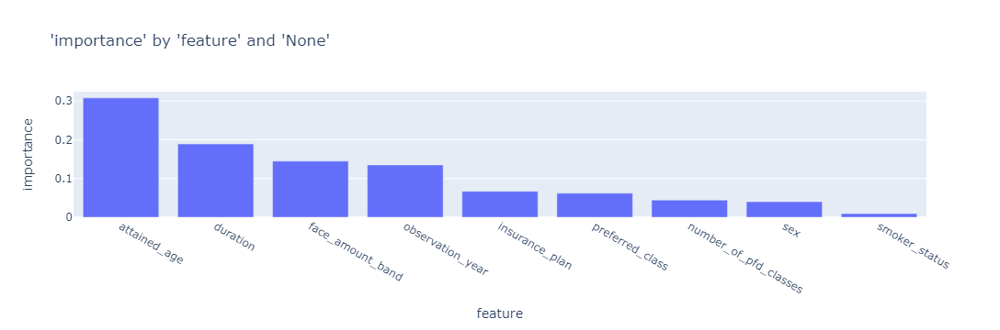

In [67]:
charters.chart(
    df=importance, x_axis="feature", y_axis="importance", type="bar", y_sort=True
)

 2024-04-25 16:35:41 | morai.experience.charters | INFO     | The weights list is 1 long and should be 3 long. Using the first weight for all weights. 
 2024-04-25 16:35:41 | morai.experience.charters | INFO     | Binning feature: [duration] with 5 bins 


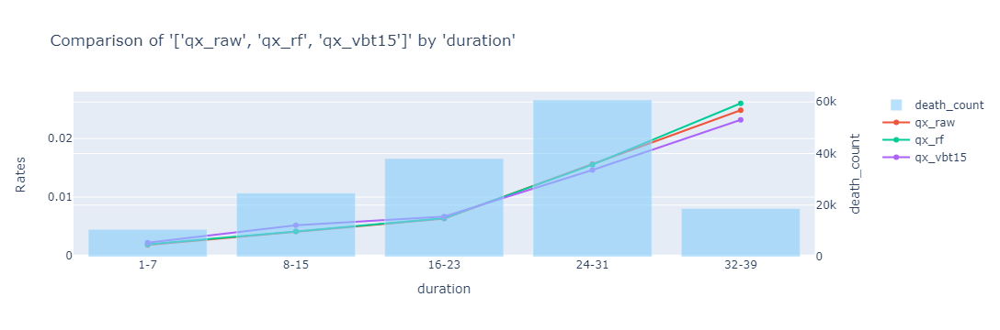

In [68]:
charters.compare_rates(
    model_data,
    x_axis="duration",
    rates=["qx_raw", "qx_rf", "qx_vbt15"],
    weights=["amount_exposed"],
    secondary="death_count",
    x_bins=5,
    y_log=False,
)

 2024-04-25 16:35:42 | morai.experience.charters | INFO     | Binning feature: [duration] with 6 bins 


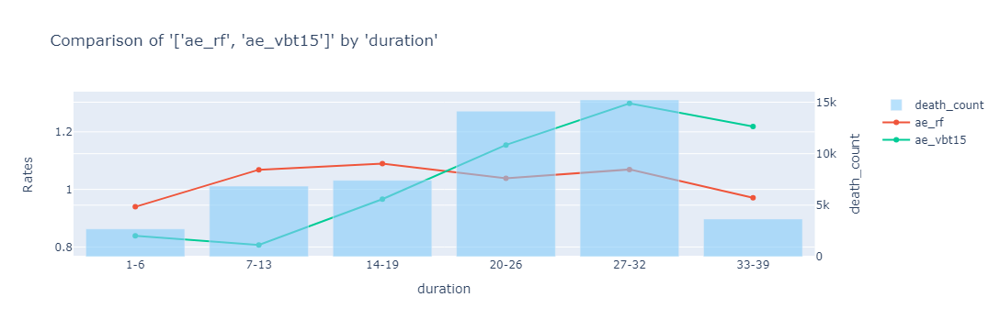

In [69]:
charters.compare_rates(
    df=model_data[model_data["insurance_plan"].isin(["UL", "ULSG"])],
    x_axis="duration",
    rates=["ae_rf", "ae_vbt15"],
    weights=["exp_amt_rf", "exp_amt_vbt15"],
    secondary="death_count",
    x_bins=6,
    display=True,
)

 2024-04-25 16:35:42 | morai.experience.charters | INFO     | Model: [RandomForestRegressor] for partial dependence plot. 
 2024-04-25 16:35:42 | morai.experience.charters | INFO     | Weights: [amount_exposed] 
 2024-04-25 16:35:42 | morai.experience.charters | INFO     | x_axis: [insurance_plan] type: [passthrough] 
 2024-04-25 16:39:14 | morai.experience.charters | INFO     | Adding secondary to chart: [death_count] 


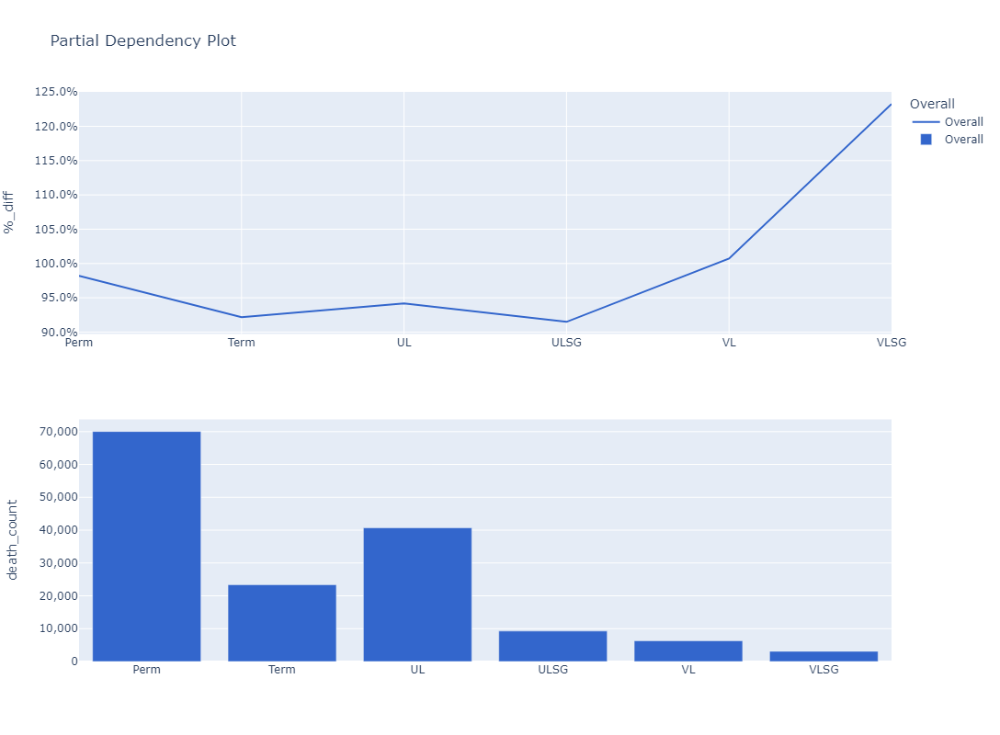

In [70]:
charters.pdp(
    model=model,
    df=md_encoded,
    x_axis="insurance_plan",
    weight="amount_exposed",
    secondary="death_count",
    mapping=mapping,
    display=True,
)

 2024-04-27 01:22:26 | morai.experience.charters | INFO     | Model: [RandomForestRegressor] for partial dependence plot. 
 2024-04-27 01:22:26 | morai.experience.charters | INFO     | Weights: [amount_exposed] 
 2024-04-27 01:22:26 | morai.experience.charters | INFO     | x_axis: [duration] type: [passthrough] 
 2024-04-27 01:22:26 | morai.experience.charters | INFO     | Line feature: [preferred_class] type: [ordinal] 
 2024-04-27 01:22:26 | morai.experience.charters | WARNING  | Using a quick method for pdp. Results may not be as accurate. 
 2024-04-27 10:47:09 | morai.experience.charters | INFO     | Binning feature: [duration] with 5 bins 
 2024-04-27 10:47:09 | morai.experience.charters | INFO     | Adding secondary to chart: [death_count] 


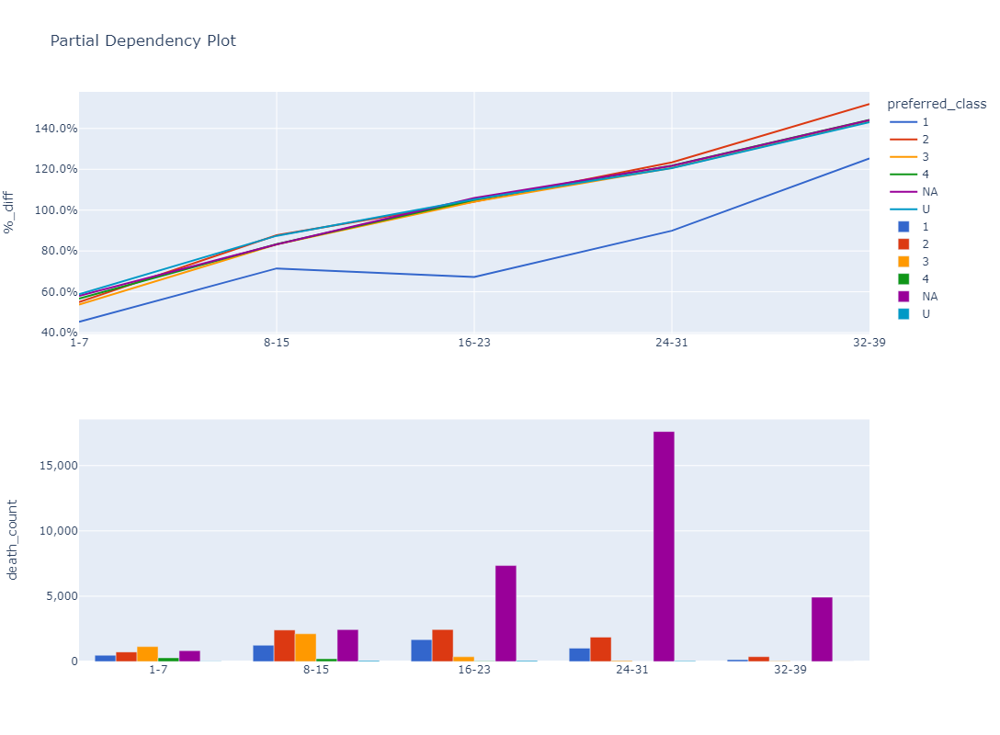

In [201]:
charters.pdp(
    model=model,
    df=md_encoded[md_encoded["insurance_plan"].isin([2, 3])],
    x_axis="duration",
    line_color="preferred_class",
    weight="amount_exposed",
    secondary="death_count",
    mapping=mapping,
    x_bins=5,
    display=True,
    quick=True,
)

In [183]:
charters.pdp(
    model=model,
    df=md_encoded,
    x_axis="observation_year",
    line_color="insurance_plan",
    weight="amount_exposed",
    secondary="death_count",
    mapping=mapping,
    display=True,
)

 2024-04-25 20:16:36 | morai.experience.charters | INFO     | Model: [RandomForestRegressor] for partial dependence plot. 
 2024-04-25 20:16:36 | morai.experience.charters | INFO     | Weights: [amount_exposed] 
 2024-04-25 20:16:36 | morai.experience.charters | INFO     | x_axis: [observation_year] type: [passthrough] 
 2024-04-25 20:16:36 | morai.experience.charters | INFO     | Line feature: [insurance_plan] type: [ordinal] 
 2024-04-25 20:43:35 | morai.experience.charters | INFO     | Adding secondary to chart: [death_count] 


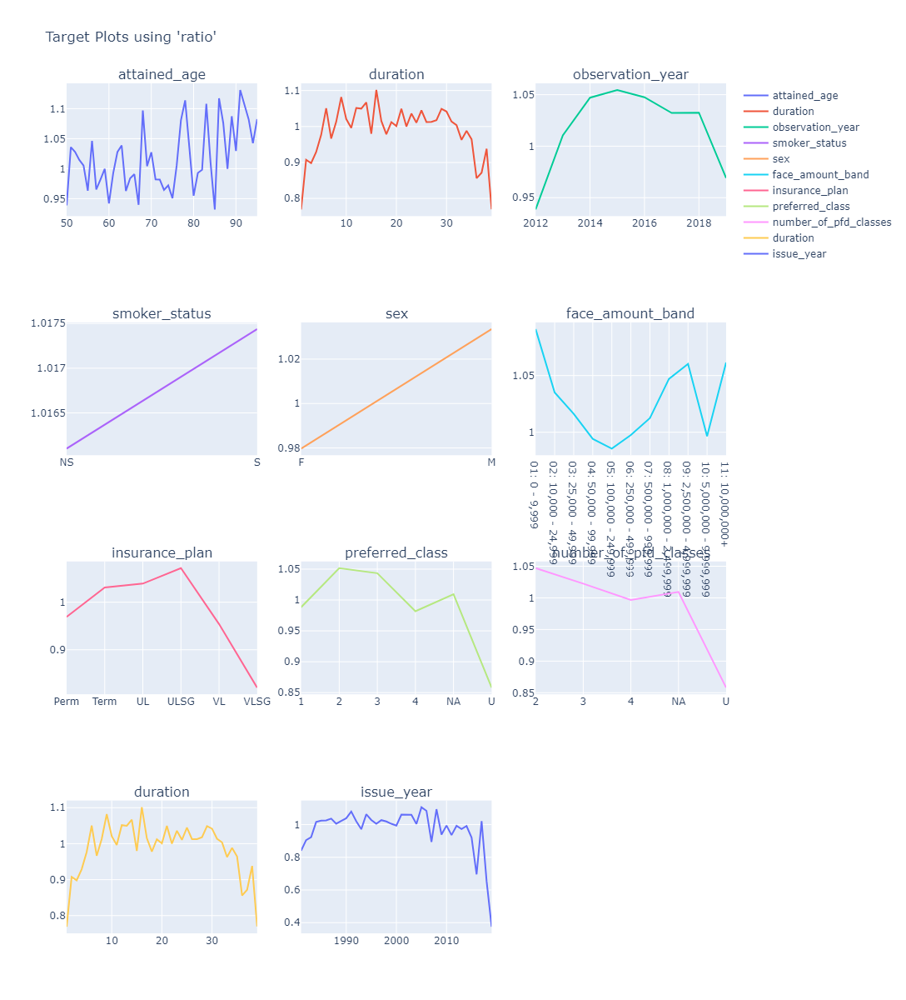

In [72]:
charters.target(
    df=model_data,
    target="ratio",
    cols=3,
    features=model_features + ["duration", "issue_year"],
    numerator="death_claim_amount",
    denominator="exp_amt_rf",
).show()

## LightGBM

**Feature Preprocessing:**
- LightGBM doesn't need all numeric variables and can handle categorical

In [73]:
model_name = "lgb"

In [74]:
preprocess_dict = preprocessors.preprocess_data(
    model_data,
    feature_dict=feature_dict,
    standardize=False,
    preset="pass",
)

 2024-04-25 16:46:51 | morai.forecast.preprocessors | WARNING  | ['slct_ult_ind'] not in the model_data 
 2024-04-25 16:46:51 | morai.forecast.preprocessors | INFO     | using 'pass' preset which makes all features passthrough 
 2024-04-25 16:46:51 | morai.forecast.preprocessors | INFO     | model target: ['qx_raw'] 
 2024-04-25 16:46:51 | morai.forecast.preprocessors | INFO     | model weights: ['amount_exposed'] 
 2024-04-25 16:46:51 | morai.forecast.preprocessors | INFO     | passthrough - (generally numeric): ['attained_age', 'duration', 'observation_year', 'smoker_status', 'sex', 'face_amount_band', 'insurance_plan', 'preferred_class', 'number_of_pfd_classes'] 


In [75]:
X = preprocess_dict["X"]
y = preprocess_dict["y"]
weights = preprocess_dict["weights"]
mapping = preprocess_dict["mapping"]
md_encoded = preprocess_dict["md_encoded"]
model_features = preprocess_dict["model_features"]

X_train, X_test, y_train, y_test, weights_train, weights_test = train_test_split(
    X, y, weights, random_state=0, test_size=0.2
)

In [76]:
import lightgbm as lgb

if model_build:
    params = {
        "boosting_type": "gbdt",
        "objective": "regression",
        "metric": "rmse",
        "num_leaves": 31,
        "learning_rate": 0.05,
        "feature_fraction": 0.5,
        "bagging_fraction": 0.8,
        "bagging_freq": 5,
    }

    train_data = lgb.Dataset(X_train, label=y_train, weight=weights_train)
    model = lgb.train(params, train_data)
if model_load:
    model = joblib.load(f"files/models/{model_name}.joblib")
    logger.info(f"loaded model '{model_name}'")
if model_save:
    joblib.dump(model, f"files/models/{model_name}.joblib")
    logger.info(f"saved model '{model_name}'")

model_params = {"weights": True}
model_params.update(model.params)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 134
[LightGBM] [Info] Number of data points in the train set: 874836, number of used features: 9
[LightGBM] [Info] Start training from score 0.004640
 2024-04-25 16:46:59 | __main__ | INFO     | saved model 'lgb' 


In [77]:
predictions = model.predict(X)

In [78]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [79]:
importance = get_importance(
    features=X.columns, values=model.feature_importance(importance_type="gain")
)

In [80]:
# get results
scorecard = model_results.get_scorecard(
    y_true_train=y_train,
    y_pred_train=model.predict(X_train),
    weights_train=weights_train,
    y_true_test=y_test,
    y_pred_test=model.predict(X_test),
    weights_test=weights_test,
    model=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=preprocess_dict,
    model_params=model_params,
    scorecard=scorecard,
    importance=importance,
)

 2024-04-25 16:47:05 | morai.forecast.metrics | INFO     | Adding model 'lgb' 


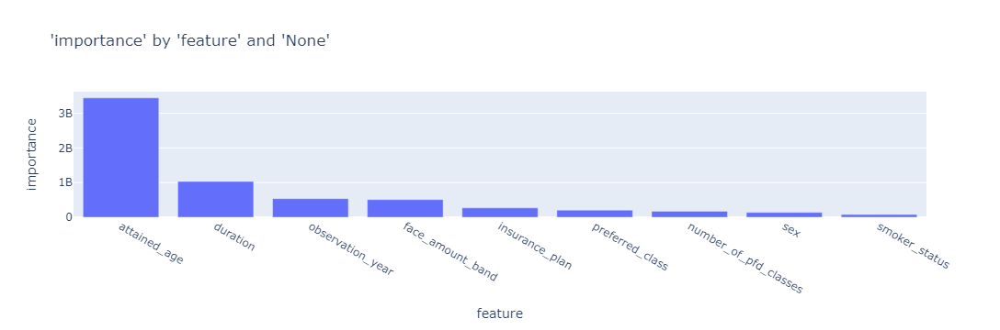

In [81]:
charters.chart(
    df=importance, x_axis="feature", y_axis="importance", type="bar", y_sort=True
)

 2024-04-25 16:47:05 | morai.experience.charters | INFO     | The weights list is 1 long and should be 3 long. Using the first weight for all weights. 


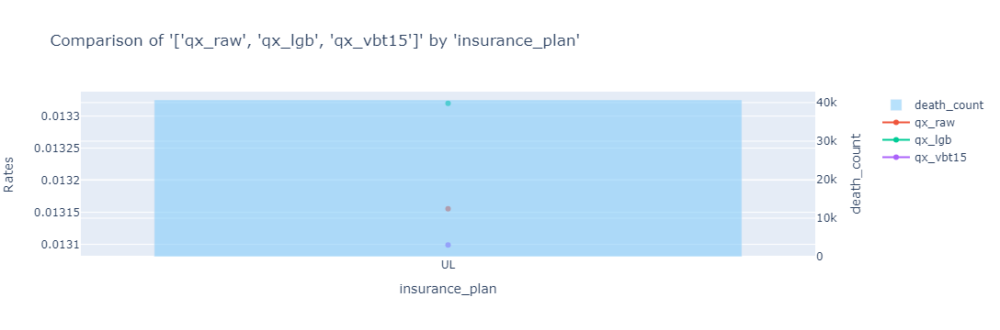

In [82]:
charters.compare_rates(
    model_data[model_data["insurance_plan"].isin(["UL"])],
    x_axis="insurance_plan",
    rates=["qx_raw", "qx_lgb", "qx_vbt15"],
    weights=["amount_exposed"],
    secondary="death_count",
)

In [83]:
# charters.pdp(
#     model=model,
#     df=model_data,
#     x_axis="number_of_pfd_classes",
#     line_color="preferred_class",
#     weight="amount_exposed",
#     mapping=mapping,
#     display=True,
# )

In [84]:
# charters.pdp(
#     model=model,
#     df=model_data,
#     x_axis="duration",
#     line_color="preferred_class",
#     weight="amount_exposed",
#     secondary="death_count",
#     mapping=mapping,
#     x_bins=5,
#     display=True,
# )

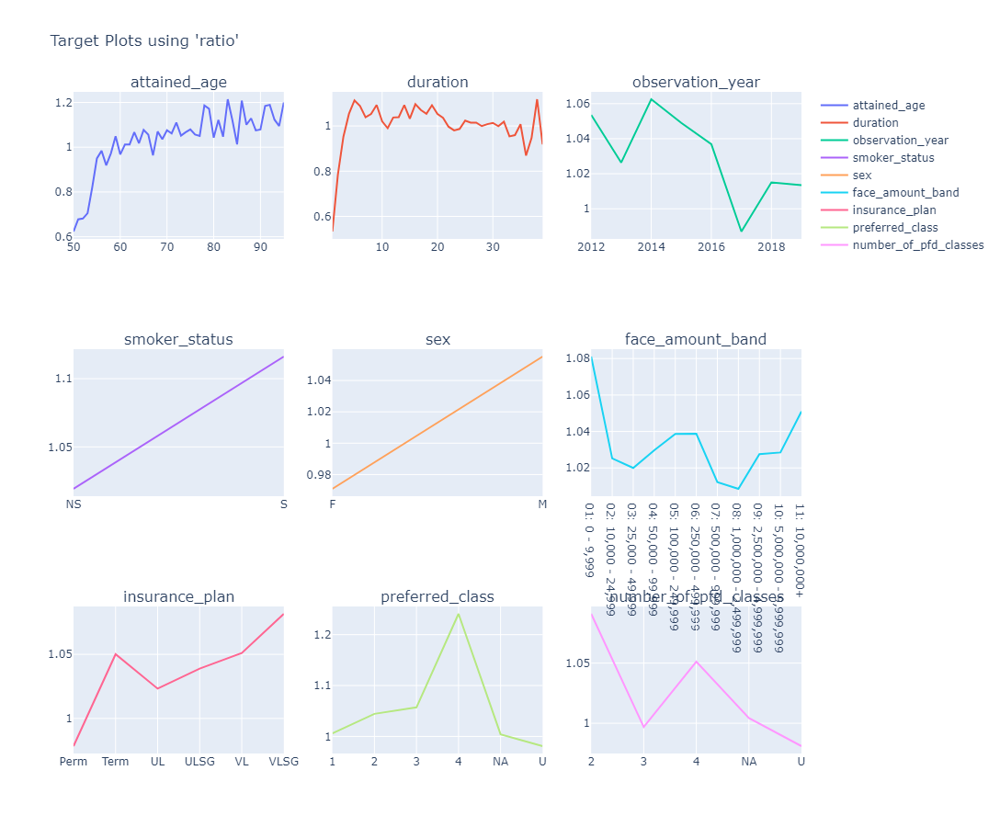

In [85]:
charters.target(
    df=model_data,
    target="ratio",
    cols=3,
    features=model_features,
    numerator="death_claim_amount",
    denominator="exp_amt_lgb",
).show()

In [86]:
# lgb.plot_tree(model, tree_index=0, figsize=(20, 10))
# plt.show()

## XGBoost

**Feature Preprocessing:**
- XGBoost doesn't need all numeric variables and can handle categorical

In [381]:
model_name = "xgb"

In [382]:
preprocess_dict = preprocessors.preprocess_data(
    model_data,
    feature_dict=feature_dict,
    standardize=False,
    preset="pass",
)

 2024-04-28 14:01:05 | morai.forecast.preprocessors | WARNING  | ['slct_ult_ind'] not in the model_data 
 2024-04-28 14:01:05 | morai.forecast.preprocessors | INFO     | using 'pass' preset which makes all features passthrough 
 2024-04-28 14:01:05 | morai.forecast.preprocessors | INFO     | model target: ['qx_raw'] 
 2024-04-28 14:01:05 | morai.forecast.preprocessors | INFO     | model weights: ['amount_exposed'] 
 2024-04-28 14:01:05 | morai.forecast.preprocessors | INFO     | passthrough - (generally numeric): ['attained_age', 'duration', 'observation_year', 'smoker_status', 'sex', 'face_amount_band', 'insurance_plan', 'preferred_class', 'number_of_pfd_classes'] 


In [383]:
X = preprocess_dict["X"]
y = preprocess_dict["y"]
weights = preprocess_dict["weights"]
mapping = preprocess_dict["mapping"]
md_encoded = preprocess_dict["md_encoded"]
model_features = preprocess_dict["model_features"]

X_train, X_test, y_train, y_test, weights_train, weights_test = train_test_split(
    X, y, weights, random_state=0, test_size=0.2
)

In [384]:
import xgboost as xgb
from xgboost import XGBRegressor

if model_build:
    model = XGBRegressor(
        objective="reg:squarederror",
        eval_metric="rmse",
        max_depth=6,
        eta=0.05,
        subsample=0.8,
        colsample_bytree=0.5,
        enable_categorical=True,
    )

    model.fit(X_train, y_train, sample_weight=weights_train)
if model_load:
    model = joblib.load(f"files/models/{model_name}.joblib")
    logger.info(f"loaded model '{model_name}'")
if model_save:
    joblib.dump(model, f"files/models/{model_name}.joblib")
    logger.info(f"saved model '{model_name}'")

model_params = {"weights": True}
model_params.update(model.get_params())

 2024-04-28 14:01:07 | __main__ | INFO     | loaded model 'xgb' 


In [91]:
predictions = model.predict(X)

In [92]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [93]:
importance = get_importance(features=X.columns, values=model.feature_importances_)

In [94]:
scorecard = model_results.get_scorecard(
    y_true_train=y_train,
    y_pred_train=model.predict(X_train),
    weights_train=weights_train,
    y_true_test=y_test,
    y_pred_test=model.predict(X_test),
    weights_test=weights_test,
    model=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=preprocess_dict,
    model_params=model_params,
    scorecard=scorecard,
    importance=importance,
)

 2024-04-25 16:47:21 | morai.forecast.metrics | INFO     | Adding model 'xgb' 


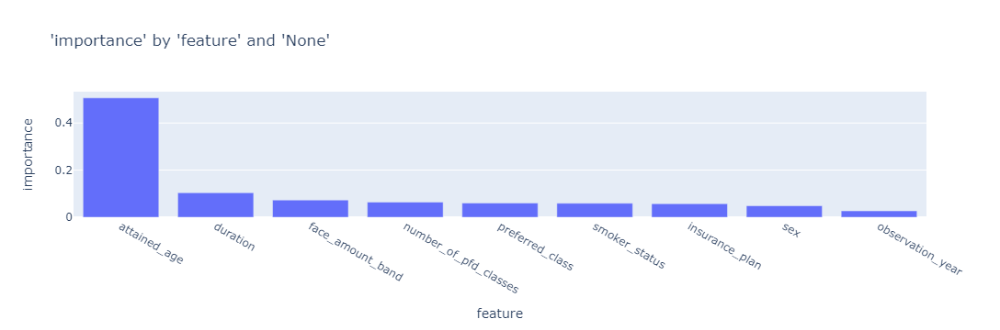

In [95]:
charters.chart(
    df=importance, x_axis="feature", y_axis="importance", type="bar", y_sort=True
)

 2024-04-25 16:47:22 | morai.experience.charters | INFO     | The weights list is 1 long and should be 3 long. Using the first weight for all weights. 


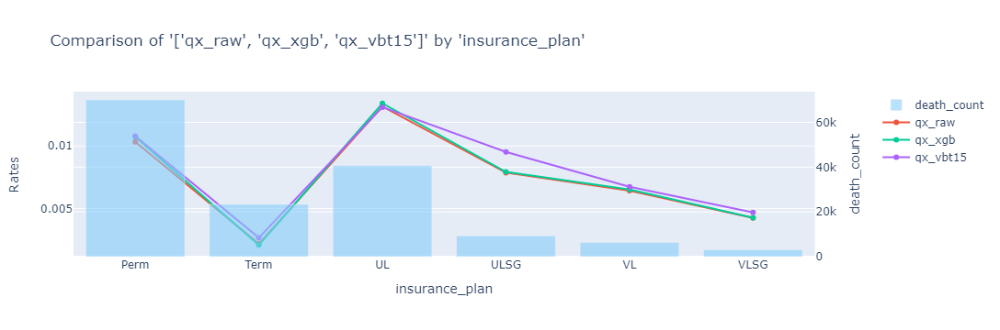

In [96]:
charters.compare_rates(
    model_data,
    x_axis="insurance_plan",
    rates=["qx_raw", "qx_xgb", "qx_vbt15"],
    weights=["amount_exposed"],
    secondary="death_count",
)

In [97]:
# charters.pdp(
#     model=model,
#     df=model_data,
#     x_axis="insurance_plan",
#     weight="amount_exposed",
#     mapping=None,
#     display=True,
# )

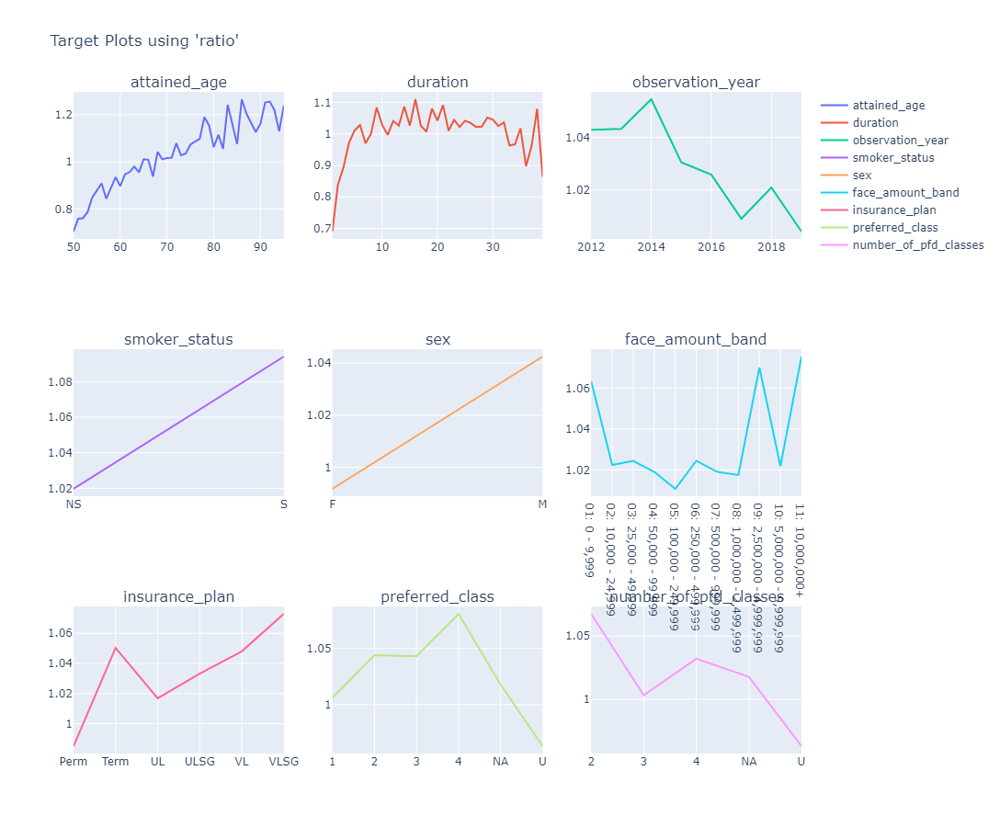

In [98]:
charters.target(
    df=model_data,
    target="ratio",
    cols=3,
    features=model_features,
    numerator="death_claim_amount",
    denominator="exp_amt_xgb",
).show()

In [99]:
# lgb.plot_tree(bst, tree_index=0, figsize=(20, 10))
# plt.show()

## CatBoost

**Feature Preprocessing:**
- CatBoost doesn't need all numeric variables and can handle categorical

In [36]:
model_name = "cat"

In [37]:
preprocess_dict = preprocessors.preprocess_data(
    model_data,
    feature_dict=feature_dict,
    standardize=False,
    preset="pass",
)

 2024-06-18 17:13:41 | morai.forecast.preprocessors | WARNING  | ['slct_ult_ind'] not in the model_data 
 2024-06-18 17:13:41 | morai.forecast.preprocessors | INFO     | using 'pass' preset which makes all features passthrough 
 2024-06-18 17:13:41 | morai.forecast.preprocessors | INFO     | model target: ['qx_raw'] 
 2024-06-18 17:13:41 | morai.forecast.preprocessors | INFO     | model weights: ['amount_exposed'] 
 2024-06-18 17:13:41 | morai.forecast.preprocessors | INFO     | passthrough - (generally numeric): ['attained_age', 'duration', 'observation_year', 'sex', 'smoker_status', 'number_of_pfd_classes', 'preferred_class', 'insurance_plan', 'face_amount_band'] 


In [38]:
X = preprocess_dict["X"]
y = preprocess_dict["y"]
weights = preprocess_dict["weights"]
mapping = preprocess_dict["mapping"]
md_encoded = preprocess_dict["md_encoded"]
model_features = preprocess_dict["model_features"]

X_train, X_test, y_train, y_test, weights_train, weights_test = train_test_split(
    X, y, weights, random_state=0, test_size=0.2
)

In [39]:
cat_features = feature_dict["ordinal"] + feature_dict["ohe"] + feature_dict["nominal"]
cat_features = list(set(cat_features) & set(model_features))

In [40]:
from catboost import CatBoostRegressor

if model_build:
    model = CatBoostRegressor(
        iterations=1000, learning_rate=.1, depth=7, cat_features=cat_features
    )
    model.fit(X_train, y_train, sample_weight=weights_train, verbose=0)
if model_load:
    model = joblib.load(f"files/models/{model_name}.joblib")
    logger.info(f"loaded model '{model_name}'")
if model_save:
    joblib.dump(model, f"files/models/{model_name}.joblib")
    logger.info(f"saved model '{model_name}'")

model_params = {"weights": True}
model_params.update(model.get_params())

In [41]:
predictions = model.predict(X)

In [42]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [43]:
importance = get_importance(features=X.columns, values=model.feature_importances_)

In [71]:
scorecard = model_results.get_scorecard(
    y_true_train=y_train,
    y_pred_train=model.predict(X_train),
    weights_train=weights_train,
    y_true_test=y_test,
    y_pred_test=model.predict(X_test),
    weights_test=weights_test,
    model=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=preprocess_dict,
    model_params=model_params,
    scorecard=scorecard,
    importance=importance,
)

 2024-05-18 00:14:33 | morai.forecast.metrics | ERROR    | Model name cat already exists, not adding model. Please use a different name. 


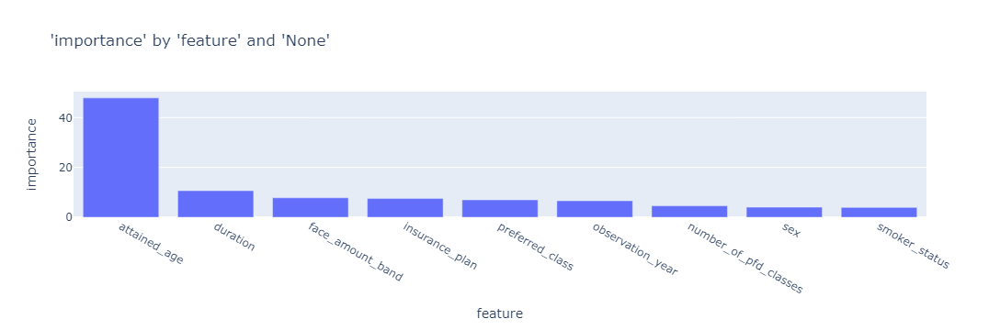

In [44]:
charters.chart(
    df=importance, x_axis="feature", y_axis="importance", type="bar", y_sort=True
)

 2024-05-18 00:20:07 | morai.experience.charters | INFO     | The weights list is 1 long and should be 3 long. Using the first weight for all weights. 


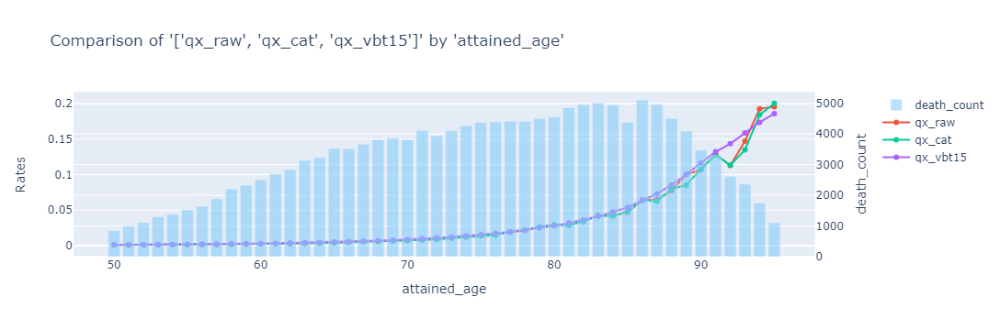

In [77]:
charters.compare_rates(
    model_data,
    x_axis="attained_age",
    rates=["qx_raw", "qx_cat", "qx_vbt15"],
    weights=["amount_exposed"],
    secondary="death_count",
)

 2024-06-18 22:02:34 | morai.experience.charters | INFO     | Model: [CatBoostRegressor] for partial dependence plot. 
 2024-06-18 22:02:34 | morai.experience.charters | INFO     | Weights: [amount_exposed] 
 2024-06-18 22:02:34 | morai.experience.charters | INFO     | x_axis: [preferred_class] type: [passthrough] 
 2024-06-18 22:02:34 | morai.experience.charters | INFO     | Creating 6 predictions. 


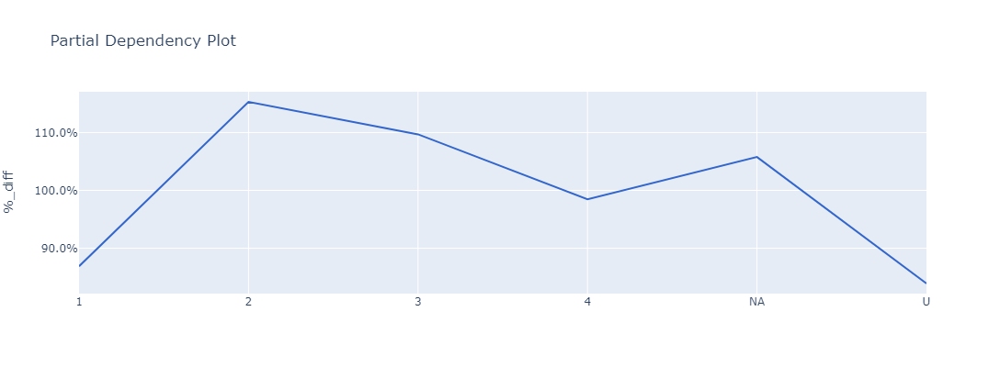

In [53]:
charters.pdp(
    model=model,
    df=md_encoded,
    x_axis="preferred_class",
    weight="amount_exposed",
    mapping=mapping,
    display=True,
)

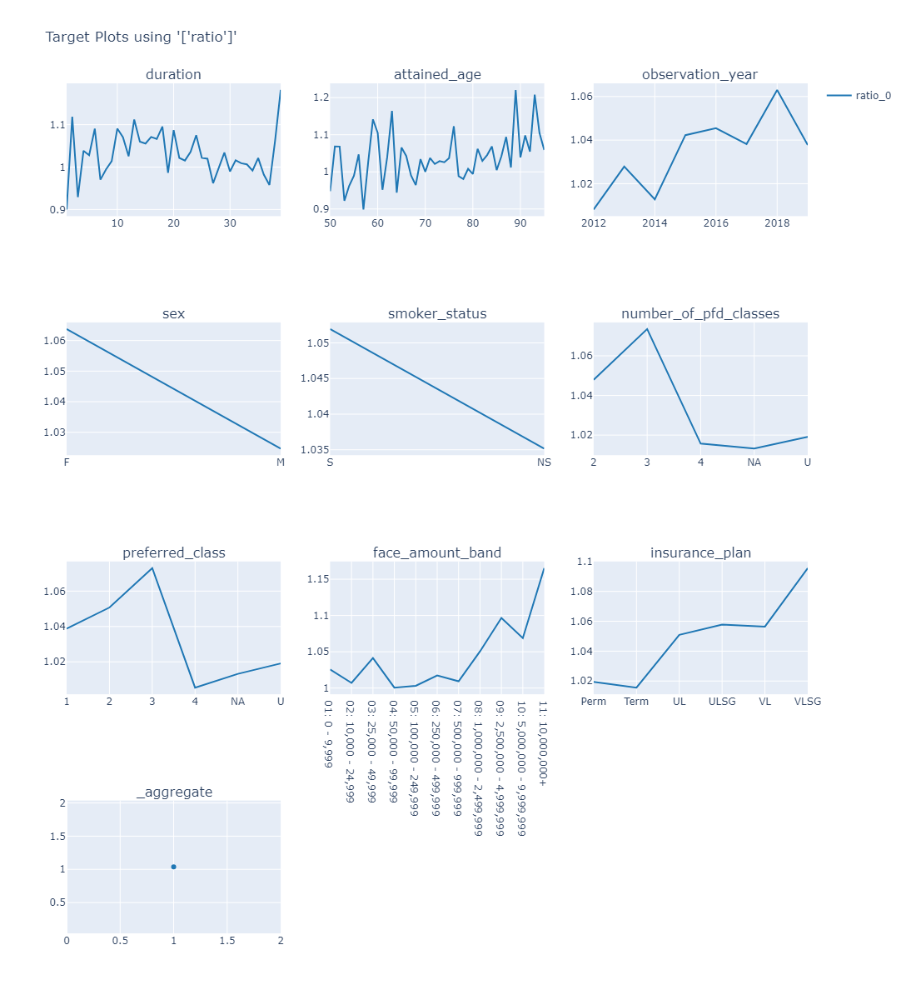

In [74]:
charters.target(
    df=model_data,
    target="ratio",
    cols=3,
    features=model_features,
    numerator=["death_claim_amount"],
    denominator=["exp_amt_cat"],
).show()

## Lee Carter

The Lee-Carter model is formulated as follows:

$$\log(m_{x,t}) = a_{x} + b_{x}k_{t} + \epsilon_{x,t}$$

source: https://en.wikipedia.org/wiki/Lee%E2%80%93Carter_model

Where:
- $m_{x,t}$ is the _matrix mortality rate_ at age $x$ in year $t$
- $a_{x}$ describes the general _shape_ of mortality at age $x$ (mean of the time-averaged logs of the central mortality rate at age $x$). This is known as the _age effect_ on mortality.
- $b_{x}$ measures the change in the rates at age $x$ due to a change in the underlying time trend, $k_{t}$.
- $k_{t}$ reflects the effect of the time trend, $t$, on mortality.
- $\epsilon_{x,t}$ are i.i.d. normal random variables with zero means and constant variance, $\sigma^{2}$.

In [100]:
model_name = "lc"

In [101]:
model_params = {"weights": True}
model = models.LeeCarter()

 2024-04-25 16:47:23 | morai.forecast.models | INFO     | initialized LeeCarter 


In [102]:
lc_df = model.structure_df(model_data)

 2024-04-25 16:47:23 | morai.forecast.models | INFO     | grouping data by age and year 
 2024-04-25 16:47:23 | morai.forecast.models | INFO     | calculating qx_raw rates using death_claim_amount and amount_exposed 
 2024-04-25 16:47:23 | morai.forecast.models | INFO     | there were 0 rates over 1 that were capped. 
 2024-04-25 16:47:23 | morai.forecast.models | INFO     | crude_df shape: (368, 5) 


In [103]:
lc_df = model.fit(lc_df)

 2024-04-25 16:47:23 | morai.forecast.models | INFO     | creating Lee Carter model with qx_raw rates... 
 2024-04-25 16:47:23 | morai.forecast.models | INFO     | age range: 50, 95 
 2024-04-25 16:47:23 | morai.forecast.models | INFO     | year range: 2012, 2019 
 2024-04-25 16:47:23 | morai.forecast.models | INFO     | calculating qx_lc = exp(a_x + b_x * k_t) 
 2024-04-25 16:47:23 | morai.forecast.models | INFO     | adding qx_lc to lc_df 


In [104]:
model_data = model.map(model_data)

 2024-04-25 16:47:23 | morai.forecast.models | INFO     | mapping qx_lc to df 


In [105]:
lcf_df = model.forecast(years=5)

 2024-04-25 16:47:24 | morai.forecast.models | INFO     | forecasting qx_lc using deterministic random walk... 


In [106]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [107]:
scorecard = model_results.get_scorecard(
    y_true_train=model_data["death_claim_amount"],
    y_pred_train=model_data[f"exp_amt_{model_name}"],
    weights_train=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=None,
    model_params=model_params,
    scorecard=scorecard,
    importance=None,
)

 2024-04-25 16:47:24 | morai.forecast.metrics | INFO     | Adding model 'lc' 


Average log qx shows that mortality rates increase by age

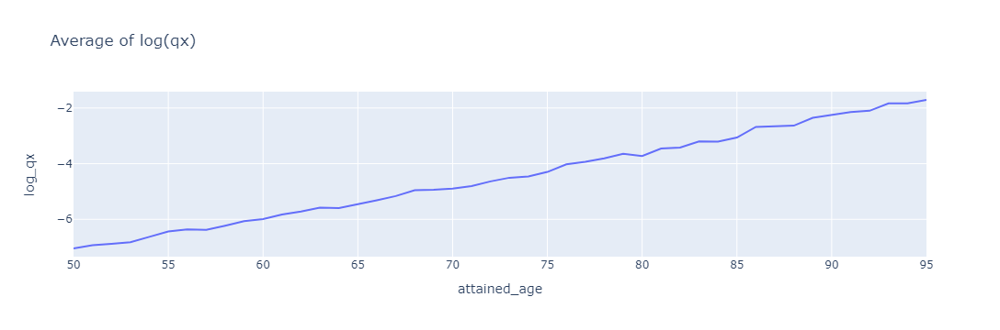

In [108]:
charters.chart(
    df=model.a_x.reset_index(),
    x_axis="attained_age",
    y_axis=0,
    color=None,
    type="line",
    title="Average of log(qx)",
    labels={"attained_age": "attained_age", "0": "log_qx"},
)

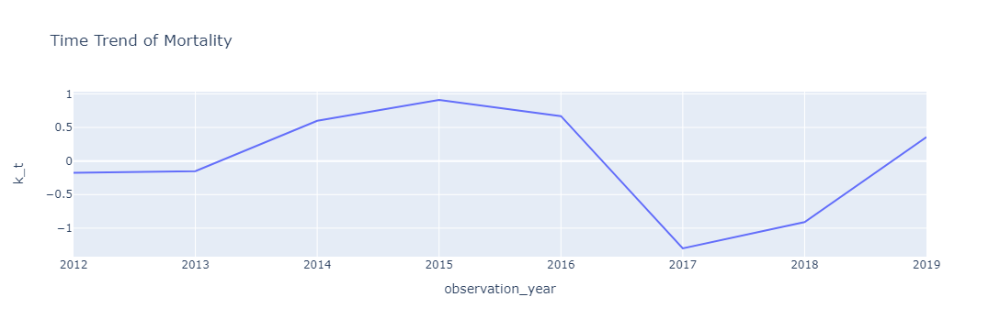

In [109]:
charters.chart(
    df=model.k_t.reset_index(),
    x_axis="observation_year",
    y_axis=0,
    color=None,
    type="line",
    title="Time Trend of Mortality",
    labels={"observation_year": "observation_year", "0": "k_t"},
)

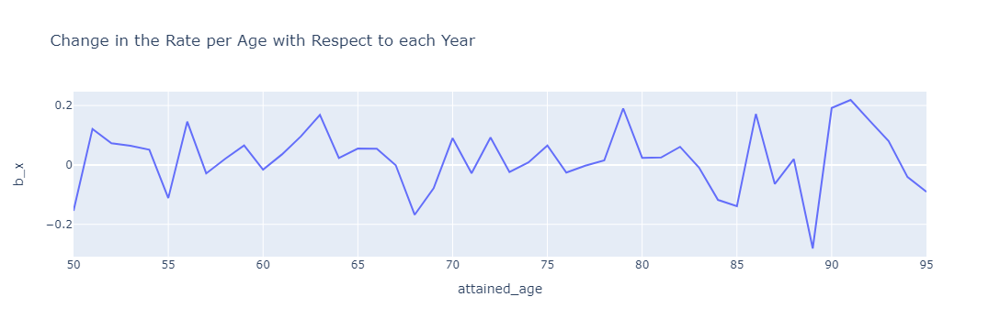

In [110]:
charters.chart(
    df=model.b_x.reset_index(),
    x_axis="attained_age",
    y_axis=0,
    color=None,
    type="line",
    title="Change in the Rate per Age with Respect to each Year",
    labels={"attained_age": "attained_age", "0": "b_x"},
)

 2024-04-25 16:47:25 | morai.experience.charters | INFO     | The weights list is 1 long and should be 2 long. Using the first weight for all weights. 


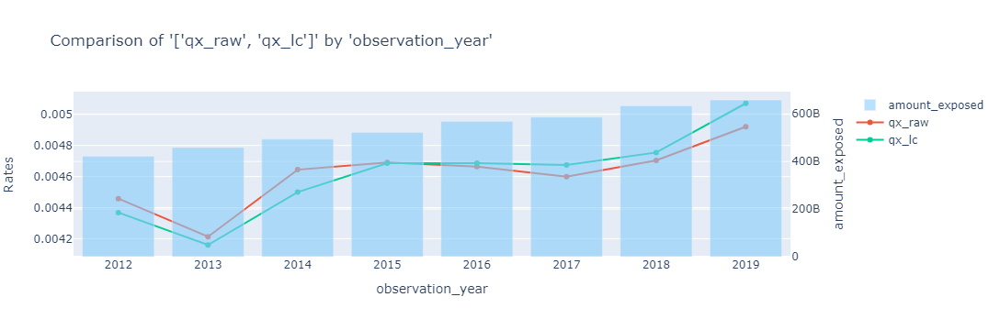

In [111]:
charters.compare_rates(
    model_data,
    x_axis="observation_year",
    rates=["qx_raw", "qx_lc"],
    weights=["amount_exposed"],
    secondary="amount_exposed",
)

## Cairns-Blake-Dowd Model

The Cairns-Blake-Dowd (CBD) model is a stochastic mortality model, and a variant of the Lee-Carter mortality model. It is designed with longevity risk in mind, particularly attempting to understand and forecast mortality at older ages.

The model is in the following form:

$$\text{logit}(_{t}q_{x}) = \kappa_{t}^{(1)} + (x - \bar{x})\kappa_{t}^{(2)}$$

- $\text{logit}(\alpha) = \log\big(\frac{\alpha}{1-\alpha}\big)$
- $\kappa_{t}^{(1)}$  is the _level_ factor, varying with respect to year $t \in (t_{1}, t_{2}, \dots, t_{q})$
- $\kappa_{t}^{(2)}$  is the _slope_ factor, varying with respect to year $t \in (t_{1}, t_{2}, \dots, t_{q})$
- $x$ is the age group, $x \in (x_{1}, x_{2}, \dots, x_{p})$
- $\bar{x}$ is the average of the age group
- $_{t}q_{x}$ is the probability an individual aged $x$ last birthday dies before age $x+t$

We will be using method of least-squares to get estimates $\hat{\kappa}^{(1)}$ and $\hat{\kappa}^{(2)}$.

Further information:
- https://www.actuaries.org/AFIR/Colloquia/Rome2/Cairns_Blake_Dowd.pdf - further discussion on the merits of the CBD model (such as age-period cohort effects and further extensions to the CBD model).

In [112]:
model_name = "cbd"

In [113]:
model_params = {"weights": True}
model = models.CBD()

 2024-04-25 16:47:26 | morai.forecast.models | INFO     | initialized CBD 


In [114]:
cbd_df = model.structure_df(model_data)

 2024-04-25 16:47:26 | morai.forecast.models | INFO     | grouping data by age and year 
 2024-04-25 16:47:26 | morai.forecast.models | INFO     | calculating qx_raw rates using death_claim_amount and amount_exposed 
 2024-04-25 16:47:26 | morai.forecast.models | INFO     | there were 0 rates over 1 that were capped. 
 2024-04-25 16:47:26 | morai.forecast.models | INFO     | cbd_df shape: (368, 5) 


In [115]:
cbd_df = model.fit(cbd_df)

 2024-04-25 16:47:26 | morai.forecast.models | INFO     | creating CBD model with qx_raw rates... 
 2024-04-25 16:47:26 | morai.forecast.models | INFO     | age range: 50, 95 
 2024-04-25 16:47:26 | morai.forecast.models | INFO     | average age: 72.5 
 2024-04-25 16:47:26 | morai.forecast.models | INFO     | year range: 2012, 2019 
 2024-04-25 16:47:26 | morai.forecast.models | INFO     | adding qx_cbd to cbd_df 


In [116]:
model_data = model.map(model_data)

 2024-04-25 16:47:26 | morai.forecast.models | INFO     | mapping qx_cbd to df 


In [117]:
cbdf_df = model.forecast(years=5)

 2024-04-25 16:47:27 | morai.forecast.models | INFO     | forecasting qx_cbd using deterministic random walk... 


In [118]:
model_data = add_qx_exp_ae(model_data, predictions, model_name)

In [119]:
scorecard = model_results.get_scorecard(
    y_true_train=model_data["death_claim_amount"],
    y_pred_train=model_data[f"exp_amt_{model_name}"],
    weights_train=None,
)
model_results.add_model(
    model_name=model_name,
    data_path=pl_parquet_path,
    data_shape=model_data.shape,
    preprocess_dict=None,
    model_params=model_params,
    scorecard=scorecard,
    importance=None,
)

 2024-04-25 16:47:27 | morai.forecast.metrics | INFO     | Adding model 'cbd' 


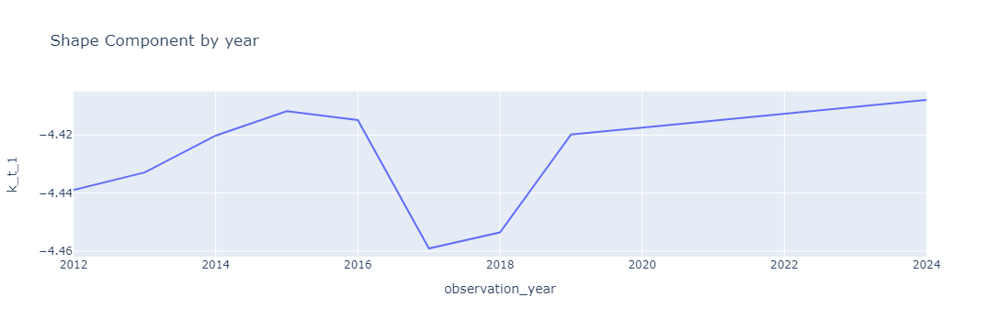

In [120]:
# shape shows the impact of time on mortality
charters.chart(
    df=pd.concat([model.k_t_1, model.k_1_f]).reset_index(),
    x_axis=model.year_col,
    y_axis=0,
    color=None,
    type="line",
    title="Shape Component by year",
    labels={"0": "k_t_1"},
)

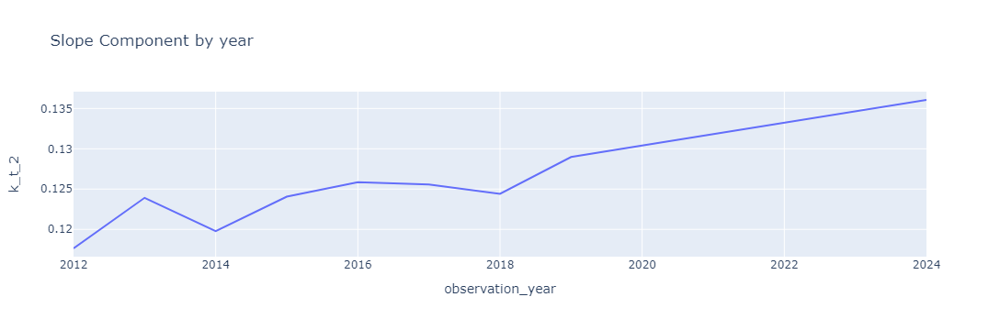

In [121]:
# slope shows if the impact of time is different by year
charters.chart(
    df=pd.concat([model.k_t_2, model.k_2_f]).reset_index(),
    x_axis=model.year_col,
    y_axis=0,
    color=None,
    type="line",
    title="Slope Component by year",
    labels={"0": "k_t_2"},
)

 2024-04-25 16:47:28 | morai.experience.charters | INFO     | The weights list is 1 long and should be 2 long. Using the first weight for all weights. 


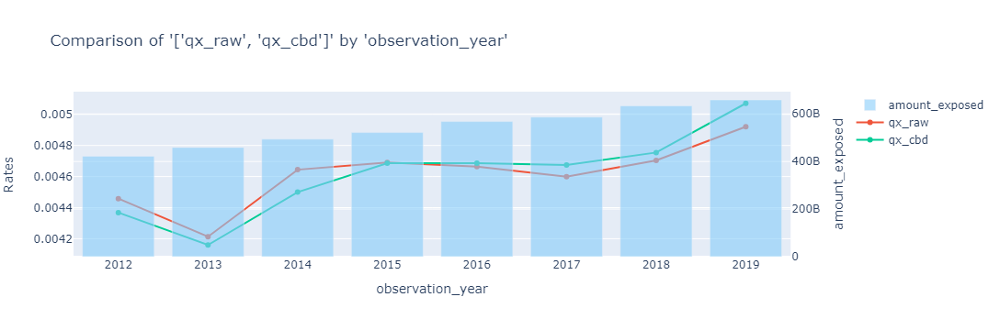

In [122]:
charters.compare_rates(
    model_data,
    x_axis="observation_year",
    rates=["qx_raw", "qx_cbd"],
    weights=["amount_exposed"],
    secondary="amount_exposed",
)

# Model Results

In [123]:
original_float_format = pd.options.display.float_format
pd.options.display.float_format = "{:,.6f}".format  # Increase to 10 decimal places
model_results.scorecard.sort_values(by=("test", "r2_score"), ascending=False)

model_name    train                                                      \
                   ae    smape  r2_score root_mean_squared_error    shape   
1        glm 1.000000 1.930105  0.091733          216,742.536042   874836   
3       tree 1.000000 1.931307  0.235634          198,832.853709   874836   
6        xgb 1.000502 1.926425  0.245602          197,532.072964   874836   
5        lgb 1.001543 1.927697  0.279286          193,071.799340   874836   
4         rf 0.993282 1.911891  0.522898          157,088.044097   874836   
2         lr 1.000000 1.931318 -0.011493          228,727.678204   874836   
0      vbt15 0.917220 1.928096  0.083708          227,973.405220  1093546   
7         lc 1.026194 1.926420  0.200737          212,917.921441  1093546   
8        cbd 1.026194 1.926420  0.200737          212,917.921441  1093546   

                             test                                             \
                     aic       ae    smape  r2_score root_mean_squared_error   
1 150,509,717,515.870117 0.981635 1.929014  0.088174          213,697.042952   
3                    NaN 0.990932 1.930420  0.077676          214,923.699476   
6                    NaN 0.985349 1.925411  0.076985          215,004.216806   
5                    NaN 0.987903 1.926655  0.074398          215,305.351991   
4                    NaN 0.966068 1.917562  0.043387          218,882.383650   
2                    NaN 0.986627 1.930265 -0.010316          224,942.367757   
0                    NaN      NaN      NaN       NaN                     NaN   
7                    NaN      NaN      NaN       NaN                     NaN   
8                    NaN      NaN      NaN       NaN                     NaN   

                                         
                     aic          shape  
1 150,509,717,515.870117 218,710.000000  
3                    NaN 218,710.000000  
6                    NaN 218,710.000000  
5                    NaN 218,710.000000  
4                    NaN 218,710.000000  
2                    NaN 218,710.000000  
0                    NaN            NaN  
7                    NaN            NaN  
8                    NaN            NaN

In [124]:
pd.options.display.float_format = original_float_format

In [ ]:
break

In [126]:
# write out results
model_results.save_model()
model_data.to_parquet("files/dataset/model_data.parquet")

 2024-04-25 16:50:00 | morai.forecast.metrics | INFO     | saving results to C:\Users\johnk\Desktop\github\morai\files\result\model_results.json 


In [ ]:
# model_results = metrics.ModelResults(filepath='model_results.json')

In [ ]:
rank_df = metrics.ae_rank(
    df=model_data[model_data["insurance_plan"].isin(["UL"])],
    features=model_features,
    actuals="death_claim_amount",
    expecteds="exp_amt_vbt15",
    exposures="amount_exposed",
)
rank_df.head()

# Visualizations

In [ ]:
charters.chart(
    df=model_data,
    x_axis="attained_age",
    y_axis="ratio",
    color=None,
    type="line",
    numerator="death_claim_amount",
    denominator="amount_exposed",
)

In [ ]:
charters.chart(
    df=model_data[
        (model_data["attained_age"] > 50)
        & (model_data["attained_age"] < 90)
        & (model_data["insurance_plan"].isin(["Term", "UL", "Perm", "ULSG"]))
    ],
    x_axis="duration",
    color="insurance_plan",
    y_axis="ratio",
    type="line",
    numerator="death_claim_amount",
    denominator="amount_exposed",
    x_bins=5,
)

In [ ]:
charters.chart(
    df=model_data,
    x_axis="observation_year",
    y_axis="ratio",
    color="insurance_plan",
    type="line",
    numerator="death_claim_amount",
    denominator="exp_amt_vbt15",
)

In [ ]:
charters.chart(
    df=model_data,
    x_axis="issue_year",
    y_axis="policies_exposed",
    color="insurance_plan",
    type="bar",
)

In [ ]:
# charters.scatter(df=df, target="qx_raw", numeric=True, sample_nbr=1000).show()

# Reload

In [ ]:
importlib.reload(charters)

In [ ]:
importlib.reload(custom_logger)

In [ ]:
importlib.reload(models)

In [ ]:
importlib.reload(helpers)

In [ ]:
importlib.reload(metrics)

In [ ]:
importlib.reload(preprocessors)

# Utilities

In [ ]:
helpers.memory_usage_jupyter(globals=globals()).head(10)

# Test

In [30]:
md_encoded.columns

Index(['observation_year', 'insurance_plan', 'issue_age', 'duration',
       'face_amount_band', 'issue_year', 'soa_post_lvl_ind',
       'number_of_pfd_classes', 'preferred_class', 'amount_exposed',
       'policies_exposed', 'death_claim_amount', 'death_count', 'qx_vbt15',
       'qx_raw', 'exp_amt_vbt15', 'ae_vbt15', 'qx_log_raw', 'attained_age',
       'capped_duration', 'smoker_status', 'sex', 'constant'],
      dtype='object')

In [32]:
mapping.keys()

dict_keys(['attained_age', 'capped_duration', 'constant', 'smoker_status', 'sex'])

In [34]:
if "" in mapping.keys():
    print("yes")